# K Nearest Neighbors Project
KNN Project! This will be a simple project very similar to the lecture, except you'll be given another data set

In [1]:
# imports
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [3]:
# read in project data csv file into dataframe
df = pd.read_csv('KNN_Project_Data')

In [4]:
# check head
df.head()

,XVPM,GWYH,TRAT,TLLZ,IGGA,HYKR,EDFS,GUUB,MGJM,JHZC,TARGET CLASS
0,1636.670614,817.988525,2565.995189,358.347163,550.417491,1618.870897,2147.641254,330.727893,1494.878631,845.136088,0
1,1013.402760,577.587332,2644.141273,280.428203,1161.873391,2084.107872,853.404981,447.157619,1193.032521,861.081809,1
2,1300.035501,820.518697,2025.854469,525.562292,922.206261,2552.355407,818.676686,845.491492,1968.367513,1647.186291,1
3,1059.347542,1066.866418,612.000041,480.827789,419.467495,685.666983,852.867810,341.664784,1154.391368,1450.935357,0
4,1018.340526,1313.679056,950.622661,724.742174,843.065903,1370.554164,905.469453,658.118202,539.459350,1899.850792,0


# EDA (Exploratory Data Analysis)

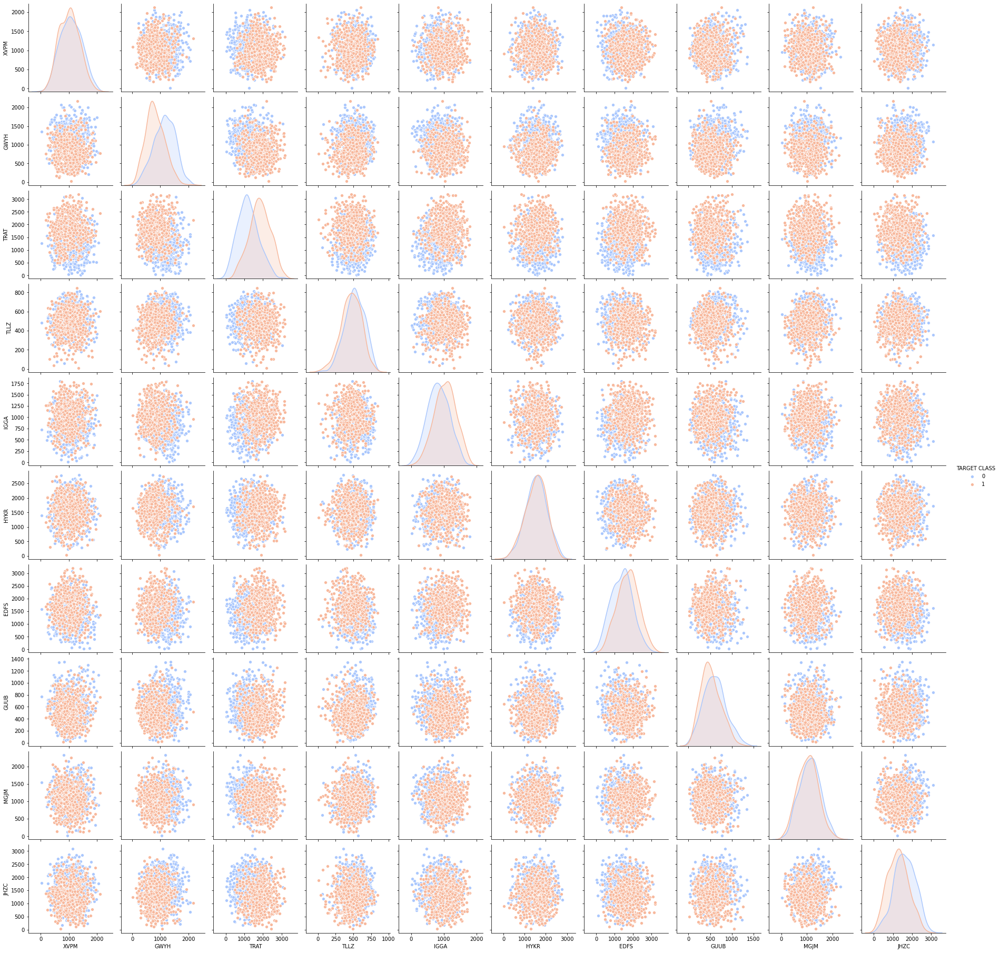

In [6]:
# paiplot with hue indicated by Target Class
sns.pairplot(df,hue='TARGET CLASS',palette='coolwarm')

# Standardize the Variables
using Scikit learn

In [7]:
from sklearn.preprocessing import StandardScaler

In [8]:
# standard scaler object
scaler = StandardScaler()

In [10]:
# fitting scaler to the features
# dropping target class as well
scaler.fit(df.drop('TARGET CLASS',axis=1))

StandardScaler()

In [11]:
# transform features to a scaled version
scaled_features = scaler.transform(df.drop('TARGET CLASS',axis=1))

In [12]:
# converting scaled features to a dataframe
df_feat = pd.DataFrame(scaled_features,columns=df.columns[:-1])

In [13]:
df_feat.head()

,XVPM,GWYH,TRAT,TLLZ,IGGA,HYKR,EDFS,GUUB,MGJM,JHZC
0,1.568522,-0.443435,1.619808,-0.958255,-1.128481,0.138336,0.980493,-0.932794,1.008313,-1.069627
1,-0.112376,-1.056574,1.741918,-1.504220,0.640009,1.081552,-1.182663,-0.461864,0.258321,-1.041546
2,0.660647,-0.436981,0.775793,0.213394,-0.053171,2.030872,-1.240707,1.149298,2.184784,0.342811
3,0.011533,0.191324,-1.433473,-0.100053,-1.507223,-1.753632,-1.183561,-0.888557,0.162310,-0.002793
4,-0.099059,0.820815,-0.904346,1.609015,-0.282065,-0.365099,-1.095644,0.391419,-1.365603,0.787762


# Train Test Split

In [14]:
from sklearn.model_selection import train_test_split

In [15]:
# creating test and train data sets
X = df_feat
y = df['TARGET CLASS']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30)

# Using KNN

In [16]:
from sklearn.neighbors import KNeighborsClassifier

In [17]:
# creating a knn model with 1 neighbor
knn = KNeighborsClassifier(n_neighbors=1)

In [18]:
# fitting knn model to training data
knn.fit(X_train,y_train)

KNeighborsClassifier(n_neighbors=1)

# Predictions and Evaluations

In [20]:
# prediction
pred = knn.predict(X_test)

In [21]:
# creating confusion matrix and classification report
from sklearn.metrics import classification_report, confusion_matrix

print(confusion_matrix(y_test,pred))

[[104  33]
 [ 53 110]]


In [22]:
print(classification_report(y_test,pred))

precision    recall  f1-score   support

           0       0.66      0.76      0.71       137
           1       0.77      0.67      0.72       163

    accuracy                           0.71       300
   macro avg       0.72      0.72      0.71       300
weighted avg       0.72      0.71      0.71       300



In [24]:
# model is average can be improved by choosing a better K value

# Choosing a K Value

In [25]:
# for loop to train various KNN models with different k values, keeps track of the error rate for each model in a list.
error_rate = []

for i in range(1,40):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(X_train,y_train)
    pred_i = knn.predict(X_test)
    error_rate.append(np.mean(pred_i != y_test))

Text(0, 0.5, 'Error Rate')

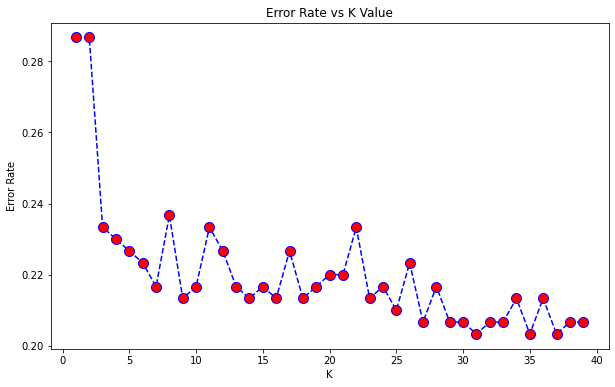

In [26]:
# plot of error_rate list
plt.figure(figsize=(10,6))
plt.plot(range(1,40),error_rate,color='blue',linestyle='dashed',marker='o',markerfacecolor='red',markersize=10)
plt.title('Error Rate vs K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')

# Retraining with a new K Value
will be retraining the model with a K value of 31, based off of the error_rate plot

In [33]:
# new knn model with k=31
knn = KNeighborsClassifier(n_neighbors=31)
knn.fit(X_train,y_train)
pred = knn.predict(X_test)

In [34]:
# confusion matrix and classification report
print(confusion_matrix(y_test,pred))
print('\n')
print(classification_report(y_test,pred))

[[108  29]
 [ 32 131]]


              precision    recall  f1-score   support

           0       0.77      0.79      0.78       137
           1       0.82      0.80      0.81       163

    accuracy                           0.80       300
   macro avg       0.80      0.80      0.80       300
weighted avg       0.80      0.80      0.80       300



# With the new K value of 31 i was able to improve the model!!